In [2]:
!pip install ultralytics wandb -q

import os
import shutil
import glob
import cv2
import numpy as np
import yaml
import random
import matplotlib.pyplot as plt
import json
import pandas as pd
from sklearn.model_selection import train_test_split
from ultralytics import YOLO
import wandb
from tqdm.notebook import tqdm
import ultralytics
ultralytics.settings.update({'wandb': True})
print("Setup complete.")

Setup complete.


In [27]:

image_dir = '/kaggle/input/cavity/def-images-20250415T155900Z-001/def-images'
mask_dir = '/kaggle/input/cavity/maks_images-20250415T155946Z-001/maks_images'
base_working_dir = '/kaggle/working/'
output_dir = os.path.join(base_working_dir, 'full_img_yolo_dataset') # Output for this approach
training_runs_dir = os.path.join(base_working_dir, 'yolo_training_runs')


train_ratio = 0.8
min_contour_area = 5
model_to_train = 'yolov8n-seg.pt' 
train_epochs = 150 
train_patience = 25 
train_batch_size = 8
train_imgsz = 640
train_lr0 = 0.001 

wandb_project = "dental-cavity-segmentation-fullimg" 
run_name = f"fullimg_{model_to_train.replace('.pt','')}_imgsz{train_imgsz}_lr{train_lr0}_ep{train_epochs}"

os.makedirs(os.path.join(output_dir, 'images/train'), exist_ok=True)
os.makedirs(os.path.join(output_dir, 'images/val'), exist_ok=True)
os.makedirs(os.path.join(output_dir, 'labels/train'), exist_ok=True)
os.makedirs(os.path.join(output_dir, 'labels/val'), exist_ok=True)
os.makedirs(training_runs_dir, exist_ok=True)

# Store config for wandb
run_config = {
    "image_dir": image_dir, "mask_dir": mask_dir,
    "train_ratio": train_ratio, "min_contour_area": min_contour_area,
    "model_to_train": model_to_train, "train_epochs": train_epochs,
    "train_patience": train_patience, "train_batch_size": train_batch_size,
    "train_imgsz": train_imgsz, "train_lr0": train_lr0,
    "run_name": run_name, "approach": "Full Image Training"
}

print("--- Configuration ---")
for key, val in run_config.items(): print(f"  {key}: {val}")
print(f"  wandb_project: {wandb_project}")
print("---------------------")

--- Configuration ---
  image_dir: /kaggle/input/cavity/def-images-20250415T155900Z-001/def-images
  mask_dir: /kaggle/input/cavity/maks_images-20250415T155946Z-001/maks_images
  train_ratio: 0.8
  min_contour_area: 5
  model_to_train: yolov8n-seg.pt
  train_epochs: 150
  train_patience: 25
  train_batch_size: 8
  train_imgsz: 640
  train_lr0: 0.001
  run_name: fullimg_yolov8n-seg_imgsz640_lr0.001_ep150
  approach: Full Image Training
  wandb_project: dental-cavity-segmentation-fullimg
---------------------


In [18]:
all_image_files = sorted(glob.glob(os.path.join(image_dir, '*.jpg')))
all_mask_files = sorted(glob.glob(os.path.join(mask_dir, '*.png')))

processed_files = 0
skipped_files = 0
temp_label_dir = os.path.join(output_dir, 'labels_temp') # Temp dir for labels
os.makedirs(temp_label_dir, exist_ok=True)

print(f"\nFound {len(all_image_files)} images and {len(all_mask_files)} masks.")
print(f"Generating labels in temporary directory: {temp_label_dir}")

for img_path in tqdm(all_image_files, desc="Generating Labels"):
    base_filename_img = os.path.basename(img_path)
    name, img_ext = os.path.splitext(base_filename_img)
    mask_filename = f"{name}.png"
    mask_path = os.path.join(mask_dir, mask_filename)
    label_path = os.path.join(temp_label_dir, f"{name}.txt") # Save to temp dir

    if not os.path.exists(mask_path):
        skipped_files += 1
        continue

    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if mask is None:
        skipped_files +=1
        continue

    h, w = mask.shape
    if h == 0 or w == 0:
        skipped_files +=1
        continue

    contours, hierarchy = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    yolo_format_lines = []
    if contours:
        for contour in contours:
            if cv2.contourArea(contour) < min_contour_area: continue
            if len(contour) < 3: continue

            polygon = contour.flatten().tolist()
            if w == 0 or h == 0: continue # Should not happen here, but safe check
            normalized_polygon = [f"{p/(w if i%2==0 else h):.6f}" for i, p in enumerate(polygon)]
            yolo_format_lines.append(f"0 {' '.join(normalized_polygon)}")

    with open(label_path, 'w') as f:
        f.write('\n'.join(yolo_format_lines))
    processed_files += 1

print(f"\n--- Label Generation Summary ---")
print(f"Processed {processed_files} masks.")
print(f"Skipped {skipped_files} masks/images.")
generated_labels = glob.glob(os.path.join(temp_label_dir, '*.txt'))
print(f"Generated {len(generated_labels)} label files.")
if processed_files != len(generated_labels):
     print("Warning: Processed count mismatch with generated labels.")
print("-----------------------------")


Found 300 images and 300 masks.
Generating labels in temporary directory: /kaggle/working/full_img_yolo_dataset/labels_temp


Generating Labels:   0%|          | 0/300 [00:00<?, ?it/s]


--- Label Generation Summary ---
Processed 300 masks.
Skipped 0 masks/images.
Generated 300 label files.
-----------------------------


In [19]:
all_images = sorted(glob.glob(os.path.join(image_dir, '*.jpg')))
all_labels = sorted(glob.glob(os.path.join(temp_label_dir, '*.txt'))) # Use temp labels

print(f"\nFound {len(all_images)} images and {len(all_labels)} generated labels.")

image_basenames = {os.path.splitext(os.path.basename(p))[0] for p in all_images}
label_basenames = {os.path.splitext(os.path.basename(p))[0] for p in all_labels}
valid_basenames = list(image_basenames.intersection(label_basenames))
print(f"Found {len(valid_basenames)} images with corresponding labels.")

if not valid_basenames:
    print("Error: No matching image/label pairs found. Cannot split.")
else:
    images_to_split = [os.path.join(image_dir, f"{name}.jpg") for name in valid_basenames]
    labels_to_split = [os.path.join(temp_label_dir, f"{name}.txt") for name in valid_basenames]

    train_images, val_images, train_labels, val_labels = train_test_split(
        images_to_split, labels_to_split,
        test_size=(1.0 - train_ratio), random_state=42
    )
    print(f"Split into {len(train_images)} train / {len(val_images)} validation samples.")

    def copy_files(file_list, dest_folder):
        copied_count = 0
        os.makedirs(dest_folder, exist_ok=True)
        for file_path in file_list:
            if os.path.exists(file_path):
                shutil.copy(file_path, dest_folder); copied_count += 1
        return copied_count

    print("Copying files to final YOLO structure...")
    train_img_copied = copy_files(train_images, os.path.join(output_dir, 'images/train'))
    val_img_copied = copy_files(val_images, os.path.join(output_dir, 'images/val'))
    train_lbl_copied = copy_files(train_labels, os.path.join(output_dir, 'labels/train'))
    val_lbl_copied = copy_files(val_labels, os.path.join(output_dir, 'labels/val'))

    print(f"\n--- Data Split Summary ---")
    print(f"  Training images copied:   {train_img_copied}/{len(train_images)}")
    print(f"  Validation images copied: {val_img_copied}/{len(val_images)}")
    print(f"  Training labels copied:   {train_lbl_copied}/{len(train_labels)}")
    print(f"  Validation labels copied: {val_lbl_copied}/{len(val_labels)}")
    print("--------------------------")

    # Cleanup temp labels
    if os.path.exists(temp_label_dir):
        print(f"Cleaning up {temp_label_dir}")
        shutil.rmtree(temp_label_dir)


Found 300 images and 300 generated labels.
Found 300 images with corresponding labels.
Split into 240 train / 60 validation samples.
Copying files to final YOLO structure...

--- Data Split Summary ---
  Training images copied:   240/240
  Validation images copied: 60/60
  Training labels copied:   240/240
  Validation labels copied: 60/60
--------------------------
Cleaning up /kaggle/working/full_img_yolo_dataset/labels_temp


In [20]:
yaml_path = os.path.join(output_dir, 'data.yaml')

data_yaml_config = {
    'path': os.path.abspath(output_dir),
    'train': 'images/train',
    'val': 'images/val',
    'nc': 1,
    'names': ['cavity']
}

with open(yaml_path, 'w') as f:
    yaml.dump(data_yaml_config, f, default_flow_style=False, sort_keys=False)

print(f"\ndata.yaml created at: {yaml_path}")
print(yaml.dump(data_yaml_config))


data.yaml created at: /kaggle/working/full_img_yolo_dataset/data.yaml
names:
- cavity
nc: 1
path: /kaggle/working/full_img_yolo_dataset
train: images/train
val: images/val



In [9]:
# Cell 7: Initialize Weights & Biases (Using Kaggle Secrets)

import wandb
from kaggle_secrets import UserSecretsClient # Import Kaggle secrets client

user_secrets = UserSecretsClient()
wandb_api_key = user_secrets.get_secret("WANDB_API_KEY") # Get key stored with label "WANDB_API_KEY"
wandb.login(key=wandb_api_key)
print("Wandb login successful using Kaggle secret.")
wandb_login_success = True



run = None # Initialize run variable
if wandb_login_success: # Only init if login seemed successful or anonymous is allowed
    # Ensure run_config dictionary is available from Cell 2
    if 'run_config' not in globals():
        print("Error: run_config not found. Re-run Cell 2.")
        # Add fallback definition if needed
        run_config = {"crop_size": crop_size, "model": model_to_train} # Minimal example
    try:
        run = wandb.init(
            project=wandb_project,
            name=run_name,
            config=run_config
        )
        print(f"Wandb run initialized. Project: {wandb_project}, Run: {run_name}")
        if run: print(f"Track run at: {run.url}") # Check if run object is valid
    except Exception as e:
        print(f"Error initializing wandb run: {e}")
        run = None # Ensure run is None on failure
else:
     print("skipping Wandb run initialization due to login failure.")

globals()['run'] = run

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: pirajeshmr (pirajesh1) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


Wandb login successful using Kaggle secret.


Wandb run initialized. Project: dental-cavity-segmentation-fullimg, Run: fullimg_yolov8n-seg_imgsz640_lr0.001_ep150
Track run at: https://wandb.ai/pirajesh1/dental-cavity-segmentation-fullimg/runs/t284fsg8


In [10]:
print(f"\nStarting training run: {run_name}")
print(f"Using model: {model_to_train}, Image size: {train_imgsz}, Epochs: {train_epochs}, Batch: {train_batch_size}, LR: {train_lr0}")

model = YOLO(model_to_train)
results_save_dir = None

# Check if wandb run was initialized successfully before training
if 'run' in globals() and run is not None and hasattr(run, 'id'):
    print(f"Logging training to Wandb run: {run.url}")
else:
    print("Warning: Wandb run not active. Training will proceed without Wandb logging.")

results = model.train(
    data=yaml_path, # Path to data.yaml created in Cell 5
    epochs=train_epochs,
    imgsz=train_imgsz,
    batch=train_batch_size,
    patience=train_patience,
    project=training_runs_dir,
    name=run_name,
    lr0 = train_lr0,
    exist_ok=False
)

results_save_dir = results.save_dir
print(f"\nTraining complete. Results saved in: {results_save_dir}")

if run:
    print(f"Finishing Wandb run: {run.url}")
    wandb.finish()

if results_save_dir:
    globals()['results_save_dir'] = results_save_dir


Starting training run: fullimg_yolov8n-seg_imgsz640_lr0.001_ep150
Using model: yolov8n-seg.pt, Image size: 640, Epochs: 150, Batch: 8, LR: 0.001


100%|██████████| 6.74M/6.74M [00:00<00:00, 89.2MB/s]


Logging training to Wandb run: https://wandb.ai/pirajesh1/dental-cavity-segmentation-fullimg/runs/t284fsg8
Ultralytics 8.3.112 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=/kaggle/working/full_img_yolo_dataset/data.yaml, epochs=150, time=None, patience=25, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/kaggle/working/yolo_training_runs, name=fullimg_yolov8n-seg_imgsz640_lr0.001_ep150, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_n

100%|██████████| 755k/755k [00:00<00:00, 17.4MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 75.2MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1242.4±267.4 MB/s, size: 50.8 KB)


train: Scanning /kaggle/working/full_img_yolo_dataset/labels/train... 240 images, 0 backgrounds, 0 corrupt: 100%|██████████| 240/240 [00:00<00:00, 1100.54it/s]

train: New cache created: /kaggle/working/full_img_yolo_dataset/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 642.2±337.9 MB/s, size: 47.1 KB)


val: Scanning /kaggle/working/full_img_yolo_dataset/labels/val... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<00:00, 1082.58it/s]

val: New cache created: /kaggle/working/full_img_yolo_dataset/labels/val.cache


Plotting labels to /kaggle/working/yolo_training_runs/fullimg_yolov8n-seg_imgsz640_lr0.001_ep150/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/yolo_training_runs/fullimg_yolov8n-seg_imgsz640_lr0.001_ep150
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/150      1.36G      2.294      4.718      4.578      2.129         16        640: 100%|██████████| 30/30 [00:06<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.99it/s]


                   all         60         60    0.00206      0.617    0.00846    0.00289    0.00128      0.383     0.0081    0.00182

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/150      1.67G      2.038       3.73      3.876      1.793         15        640: 100%|██████████| 30/30 [00:03<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.36it/s]

                   all         60         60    0.00261      0.783     0.0456     0.0147    0.00217       0.65     0.0326    0.00665



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/150      1.68G      2.083      3.573      3.886      1.815          8        640: 100%|██████████| 30/30 [00:03<00:00,  8.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.98it/s]

                   all         60         60      0.178        0.1     0.0806     0.0222     0.0636     0.0667     0.0217    0.00411



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/150      1.68G      2.076      3.464      3.533      1.852         14        640: 100%|██████████| 30/30 [00:03<00:00,  8.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.89it/s]

                   all         60         60     0.0695      0.133     0.0324     0.0108     0.0877        0.1       0.02    0.00465



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/150      1.68G       2.08      3.569      3.602      1.821         12        640: 100%|██████████| 30/30 [00:03<00:00,  7.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.11it/s]

                   all         60         60      0.133       0.15     0.0546     0.0182       0.15      0.117     0.0406     0.0115



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/150      1.68G      2.117      3.444      3.684      1.857         11        640: 100%|██████████| 30/30 [00:03<00:00,  8.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.48it/s]

                   all         60         60     0.0852      0.217     0.0557     0.0177     0.0801      0.133     0.0458     0.0132



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/150      1.68G      2.011      3.329       3.27       1.81          8        640: 100%|██████████| 30/30 [00:03<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.00it/s]

                   all         60         60      0.105        0.3     0.0796     0.0289     0.0847       0.25     0.0681     0.0221



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/150      1.68G      2.077      3.298      3.315      1.853         12        640: 100%|██████████| 30/30 [00:03<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.03it/s]

                   all         60         60      0.257       0.15       0.11     0.0299        0.2      0.117     0.0757     0.0169



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/150      1.68G      2.022      3.438      3.091      1.843         10        640: 100%|██████████| 30/30 [00:03<00:00,  7.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.39it/s]

                   all         60         60      0.366        0.2      0.174     0.0655      0.466       0.16      0.152     0.0399



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/150      1.68G      1.934      3.269       2.98      1.772         13        640: 100%|██████████| 30/30 [00:03<00:00,  8.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.46it/s]

                   all         60         60      0.219      0.233      0.153     0.0455      0.208      0.217      0.143      0.038



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/150      1.68G      1.897      3.249      2.893      1.693         13        640: 100%|██████████| 30/30 [00:03<00:00,  8.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.30it/s]

                   all         60         60      0.238       0.15      0.133     0.0543      0.376      0.167      0.145     0.0492



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/150      1.68G      1.939      3.209      2.793      1.665         17        640: 100%|██████████| 30/30 [00:03<00:00,  7.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.31it/s]

                   all         60         60      0.143      0.333      0.135     0.0619      0.137      0.317      0.104     0.0338



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/150      1.68G      1.905      3.112      2.704      1.674         11        640: 100%|██████████| 30/30 [00:03<00:00,  8.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.37it/s]

                   all         60         60      0.195        0.3       0.18     0.0838      0.201      0.283      0.184     0.0508



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/150      1.68G      1.935      3.246      2.731      1.654         10        640: 100%|██████████| 30/30 [00:03<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.54it/s]

                   all         60         60      0.223       0.25      0.147     0.0554      0.238        0.2      0.147     0.0468



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/150      1.68G      1.834      3.179      2.554      1.652         17        640: 100%|██████████| 30/30 [00:03<00:00,  8.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.39it/s]

                   all         60         60      0.429      0.251       0.23      0.102      0.437      0.259      0.234      0.088



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/150      1.68G      1.855      3.087      2.561      1.656          6        640: 100%|██████████| 30/30 [00:03<00:00,  8.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.46it/s]

                   all         60         60      0.212      0.267      0.234      0.103      0.282      0.217      0.211     0.0853



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/150      1.68G      1.834      3.059      2.564      1.709         13        640: 100%|██████████| 30/30 [00:03<00:00,  8.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.72it/s]

                   all         60         60      0.189      0.283      0.164     0.0584      0.189      0.283      0.159     0.0511



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/150      1.68G       1.54      2.713      1.899      1.427         12        640: 100%|██████████| 30/30 [00:03<00:00,  8.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.81it/s]

                   all         60         60      0.475      0.267      0.269      0.127      0.474       0.25      0.239     0.0997



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/150      1.68G      1.506      2.578      1.798      1.415         16        640: 100%|██████████| 30/30 [00:03<00:00,  8.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.96it/s]

                   all         60         60      0.421        0.3        0.3      0.164      0.421        0.3      0.284      0.109



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/150      1.68G      1.463      2.513      1.772      1.396         12        640: 100%|██████████| 30/30 [00:03<00:00,  7.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.04it/s]

                   all         60         60      0.345      0.383      0.324      0.166       0.34      0.333      0.296      0.123



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/150      1.68G      1.521      2.528      1.768      1.417         10        640: 100%|██████████| 30/30 [00:03<00:00,  7.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.63it/s]

                   all         60         60      0.386      0.383      0.311      0.156      0.437        0.3      0.294      0.102



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/150      1.68G      1.564      2.581      1.813      1.441          8        640: 100%|██████████| 30/30 [00:03<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.55it/s]

                   all         60         60      0.364      0.317      0.292      0.134      0.305      0.267      0.218     0.0843



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/150      1.68G      1.529      2.666      1.695       1.43         11        640: 100%|██████████| 30/30 [00:03<00:00,  8.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.24it/s]

                   all         60         60      0.293      0.433      0.275      0.125      0.275      0.397      0.244     0.0888



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/150      1.68G      1.546      2.573      1.866      1.393         16        640: 100%|██████████| 30/30 [00:03<00:00,  8.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.08it/s]

                   all         60         60      0.382        0.4      0.306      0.162       0.35      0.367      0.275      0.102



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/150      1.68G      1.368      2.423      1.627      1.321         10        640: 100%|██████████| 30/30 [00:03<00:00,  7.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.22it/s]

                   all         60         60      0.294      0.433      0.271      0.136      0.269      0.404      0.239     0.0938



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/150      1.68G      1.475      2.587      1.794      1.402         10        640: 100%|██████████| 30/30 [00:03<00:00,  7.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.98it/s]

                   all         60         60      0.285      0.286      0.211      0.102      0.284        0.3      0.215     0.0804



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/150      1.68G      1.478      2.558      1.739      1.377         18        640: 100%|██████████| 30/30 [00:03<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.74it/s]

                   all         60         60      0.291        0.4      0.207      0.102      0.291        0.4        0.2     0.0826



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/150      1.68G      1.407      2.431      1.684      1.301          7        640: 100%|██████████| 30/30 [00:03<00:00,  7.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.95it/s]

                   all         60         60      0.338      0.467       0.34      0.152      0.294        0.4       0.27       0.11



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/150      1.68G      1.435      2.525      1.725      1.379          6        640: 100%|██████████| 30/30 [00:03<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.17it/s]

                   all         60         60      0.419       0.45      0.349       0.15      0.419       0.45      0.338      0.101



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/150      1.68G      1.374       2.43      1.582      1.314         15        640: 100%|██████████| 30/30 [00:03<00:00,  8.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.11it/s]

                   all         60         60      0.504      0.383      0.361      0.187      0.504      0.383      0.356      0.138



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/150      1.68G      1.369      2.282      1.597      1.326         20        640: 100%|██████████| 30/30 [00:03<00:00,  7.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.76it/s]

                   all         60         60      0.499      0.333      0.375      0.189      0.499      0.333      0.365       0.13



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/150      1.68G      1.387      2.459      1.602      1.309         17        640: 100%|██████████| 30/30 [00:03<00:00,  7.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.11it/s]

                   all         60         60      0.368      0.433      0.297      0.149      0.304      0.383       0.25     0.0959



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/150      1.68G      1.478      2.552      1.641      1.351         12        640: 100%|██████████| 30/30 [00:03<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.90it/s]

                   all         60         60       0.41       0.35      0.307      0.149      0.423      0.333      0.287      0.106



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/150      1.68G      1.406       2.35      1.552      1.329         13        640: 100%|██████████| 30/30 [00:03<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.93it/s]

                   all         60         60      0.398      0.417       0.34      0.171      0.392      0.376      0.306      0.113



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/150      1.68G      1.401      2.278      1.518      1.315          9        640: 100%|██████████| 30/30 [00:03<00:00,  7.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.19it/s]

                   all         60         60      0.347      0.317      0.285      0.148      0.286        0.3      0.258      0.107



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/150      1.68G       1.44      2.492      1.598      1.395          9        640: 100%|██████████| 30/30 [00:03<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.10it/s]

                   all         60         60      0.392      0.367      0.286      0.143      0.363      0.333      0.273      0.099



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/150      1.68G      1.361      2.437      1.618      1.327         12        640: 100%|██████████| 30/30 [00:03<00:00,  7.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.24it/s]

                   all         60         60      0.488       0.25      0.275      0.139      0.488       0.25      0.274      0.103



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/150      1.68G      1.474      2.385      1.545      1.354         11        640: 100%|██████████| 30/30 [00:03<00:00,  7.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.97it/s]

                   all         60         60      0.338       0.35       0.26      0.138      0.301      0.383      0.234      0.103



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/150      1.68G      1.337      2.411       1.43      1.283         17        640: 100%|██████████| 30/30 [00:03<00:00,  8.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.01it/s]

                   all         60         60      0.341       0.45      0.286      0.138      0.337      0.372      0.256     0.0914



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/150      1.68G      1.304      2.244      1.463      1.287         11        640: 100%|██████████| 30/30 [00:03<00:00,  8.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.29it/s]

                   all         60         60       0.51        0.4       0.34      0.177      0.443      0.383      0.327       0.13



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/150      1.68G      1.384      2.384      1.571      1.327         16        640: 100%|██████████| 30/30 [00:03<00:00,  7.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.76it/s]

                   all         60         60      0.332      0.481      0.296      0.149      0.334      0.483      0.301      0.119



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/150      1.68G      1.312      2.166      1.459      1.285         20        640: 100%|██████████| 30/30 [00:03<00:00,  7.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.09it/s]

                   all         60         60      0.358      0.467      0.274      0.134      0.375      0.483      0.277     0.0974



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/150      1.68G      1.348      2.237      1.412      1.289         10        640: 100%|██████████| 30/30 [00:03<00:00,  8.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.70it/s]

                   all         60         60      0.363      0.433      0.309      0.157       0.36      0.417       0.27      0.108



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/150      1.68G      1.364      2.335      1.523      1.282         14        640: 100%|██████████| 30/30 [00:03<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.02it/s]

                   all         60         60      0.433      0.467       0.33      0.143      0.404      0.433      0.265     0.0879



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/150      1.68G      1.273      2.225      1.285      1.227         12        640: 100%|██████████| 30/30 [00:03<00:00,  7.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.01it/s]

                   all         60         60       0.51        0.4      0.402       0.19      0.393        0.4      0.324      0.125



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/150      1.68G      1.317       2.23      1.374      1.298         16        640: 100%|██████████| 30/30 [00:03<00:00,  7.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.90it/s]

                   all         60         60      0.511      0.367       0.33      0.143      0.511      0.367      0.296     0.0968



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/150      1.68G       1.27       2.33      1.354      1.245         14        640: 100%|██████████| 30/30 [00:03<00:00,  8.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.12it/s]

                   all         60         60      0.486      0.333      0.348      0.167       0.46      0.317      0.322      0.113



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/150      1.68G      1.268      2.163      1.338      1.249         11        640: 100%|██████████| 30/30 [00:03<00:00,  7.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.34it/s]

                   all         60         60        0.3      0.457      0.279      0.149        0.3      0.457      0.276      0.118



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/150      1.68G      1.286        2.2      1.417      1.255          6        640: 100%|██████████| 30/30 [00:03<00:00,  7.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.96it/s]

                   all         60         60      0.448      0.367      0.312      0.155      0.448      0.367      0.287      0.121



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/150      1.68G      1.284      2.141      1.303      1.257         15        640: 100%|██████████| 30/30 [00:03<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.09it/s]

                   all         60         60      0.398      0.367      0.347      0.166      0.337      0.333      0.313      0.124



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/150      1.68G      1.264      2.269      1.332      1.237         12        640: 100%|██████████| 30/30 [00:03<00:00,  8.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.71it/s]

                   all         60         60      0.436      0.367      0.303      0.137      0.383      0.317      0.242     0.0997



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/150      1.68G      1.273      2.265      1.371      1.262          9        640: 100%|██████████| 30/30 [00:03<00:00,  7.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.90it/s]

                   all         60         60      0.617        0.4      0.405      0.182      0.588      0.383      0.377      0.119



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/150      1.68G      1.237      2.161      1.274      1.219         12        640: 100%|██████████| 30/30 [00:03<00:00,  7.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.02it/s]

                   all         60         60      0.438        0.4      0.373      0.175      0.442        0.4      0.365      0.133



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/150      1.68G      1.259      2.259      1.268      1.219         17        640: 100%|██████████| 30/30 [00:03<00:00,  7.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.03it/s]

                   all         60         60      0.323        0.5      0.329      0.149      0.455      0.283      0.293      0.117



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/150      1.68G      1.231       2.17      1.218      1.205         17        640: 100%|██████████| 30/30 [00:03<00:00,  7.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.11it/s]

                   all         60         60      0.394       0.55      0.338      0.155       0.37      0.517      0.312      0.111
EarlyStopping: Training stopped early as no improvement observed in last 25 epochs. Best results observed at epoch 50, best model saved as best.pt.
To update EarlyStopping(patience=25) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



75 epochs completed in 0.098 hours.
Optimizer stripped from /kaggle/working/yolo_training_runs/fullimg_yolov8n-seg_imgsz640_lr0.001_ep150/weights/last.pt, 6.8MB
Optimizer stripped from /kaggle/working/yolo_training_runs/fullimg_yolov8n-seg_imgsz640_lr0.001_ep150/weights/best.pt, 6.8MB

Validating /kaggle/working/yolo_training_runs/fullimg_yolov8n-seg_imgsz640_lr0.001_ep150/weights/best.pt...
Ultralytics 8.3.112 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,258,259 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):  25%|██▌       | 1/4 [00:00<00:00,  4.57it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):  50%|█████     | 2/4 [00:00<00:00,  2.79it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.83it/s]


                   all         60         60      0.506      0.383      0.363      0.187      0.506      0.383      0.357      0.138


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.5ms preprocess, 5.6ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to /kaggle/working/yolo_training_runs/fullimg_yolov8n-seg_imgsz640_lr0.001_ep150


lr/pg0,▁██████▇▇▇▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▄▄▄▄▄▄▄▄▃▃
lr/pg1,▁▄████▇▇▇▇▇▇▇▇▇▆▆▆▆▆▆▆▆▆▅▅▅▅▅▅▅▄▄▄▄▄▄▄▄▃
lr/pg2,▂████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁
metrics/mAP50(B),▁▂▁▂▃▃▅▅▄▅▅▄▅▄▆▆▆▅▆▆▆▆▅▆▅▇▇▇▇▆▅▇▆▅▇▇▇█▇▇
metrics/mAP50(M),▁▁▁▃▃▅▅▅▅▅▄▅▅▅▃▆▆▅▆▆▅▅▅▅█▅▆▅▇▇▆▆▇▆▆▇▅███
metrics/mAP50-95(B),▁▁▂▂▃▄▃▅▅▅▅▅▅▅▄▅▅▆▅▇▅▆▄▄▆█▆▆▇▆▆▆▆█▆▆▇▆▇█
metrics/mAP50-95(M),▁▁▁▁▁▃▃▃▅▅▅▅▅▅▅▅▄▅▃▄▆▇▆▆▅▅▇██▆▆▆▆▆▅▆▇▇▆▇
metrics/precision(B),▃▁▁▄▆▂▆▇▅▆▅█▅▇▃▄▅▇▆▆▄▅▆██▆▆█▅▅▅▅▇██▇▆▇▇█
metrics/precision(M),▁▂▁▃▆▂▆▄▅▄▄▆▄▃▃▆▃▆▆▄▄▄▇▇▄▅▄▅▇▅▅▆▅▇▆▆▅▅█▆
metrics/recall(B),█▂▂▁▃▂▂▂▄▃▂▃▄▂▂▃▂▂▄▂▄▃▄▃▄▂▃▄▄▅▄▅▃▃▄▃▃▄▄▄
metrics/recall(M),█▁▂▃▂▃▂▄▃▃▃▂▅▅▃▅▃▃▅▃▅▄▃▅▄▆▄▅▄▅▄▃▅▆▅▄▆▄▄▅



Training complete. Results saved in: /kaggle/working/yolo_training_runs/fullimg_yolov8n-seg_imgsz640_lr0.001_ep150
Finishing Wandb run: https://wandb.ai/pirajesh1/dental-cavity-segmentation-fullimg/runs/t284fsg8


In [24]:
if 'results_save_dir' not in globals() or not results_save_dir or not os.path.exists(results_save_dir):
     print("Error: Training results directory not found. Cannot evaluate.")
else:
    best_model_path = os.path.join(results_save_dir, 'weights/best.pt')

    if os.path.exists(best_model_path):
        print(f"\nLoading best model from: {best_model_path}")
        model = YOLO(best_model_path) # Load the best saved model from training

        print("Evaluating model on the validation set...")
        metrics = model.val(split='val', data=yaml_path) # Use data.yaml defined in Cell 5

        print("\n--- Validation Metrics (`model.val()`) ---")
        box_map50_95 = metrics.box.map
        box_map50 = metrics.box.map50
        mask_map50_95 = metrics.seg.map
        mask_map50 = metrics.seg.map50

        print(f"  Box mAP50-95:  {box_map50_95:.4f}")
        print(f"  Box mAP50:     {box_map50:.4f}")
        print(f"  Mask mAP50-95: {mask_map50_95:.4f}")
        print(f"  Mask mAP50:    {mask_map50:.4f}")
        print("-----------------------------------------")

        globals()['model'] = model # Store loaded model globally
        globals()['best_model_path'] = best_model_path

    else:
        print(f"Error: {best_model_path} not found.")

    print(f"\nDetailed results/plots saved in: {results_save_dir}")


Loading best model from: /kaggle/working/yolo_training_runs/fullimg_yolov8n-seg_imgsz640_lr0.001_ep150/weights/best.pt
Evaluating model on the validation set...
Ultralytics 8.3.112 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,258,259 parameters, 0 gradients, 12.0 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1330.8±297.3 MB/s, size: 48.5 KB)


val: Scanning /kaggle/working/full_img_yolo_dataset/labels/val.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):  25%|██▌       | 1/4 [00:00<00:01,  2.04it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):  50%|█████     | 2/4 [00:01<00:01,  1.89it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.80it/s]


                   all         60         60      0.504      0.383      0.362      0.188      0.504      0.383      0.354      0.142


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 4.6ms preprocess, 6.0ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to runs/segment/val3

--- Validation Metrics (`model.val()`) ---
  Box mAP50-95:  0.1880
  Box mAP50:     0.3615
  Mask mAP50-95: 0.1423
  Mask mAP50:    0.3545
-----------------------------------------

Detailed results/plots saved in: /kaggle/working/yolo_training_runs/fullimg_yolov8n-seg_imgsz640_lr0.001_ep150


Looking for validation images in: /kaggle/working/full_img_yolo_dataset/images/val

Running inference and visualizing 15 sample validation images...
Inference complete.


Visualizing Samples:   0%|          | 0/15 [00:00<?, ?it/s]


--- Comparison for image: image_5617.jpg ---


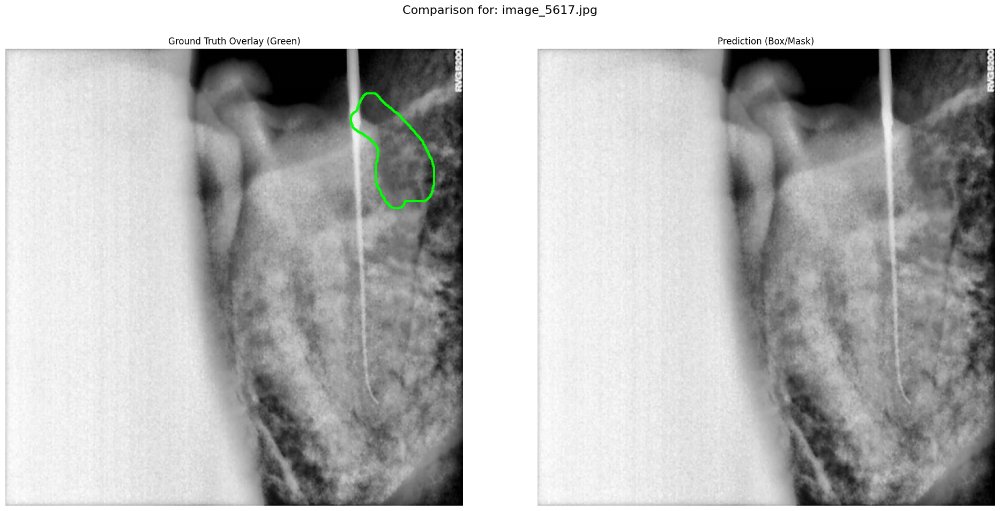


--- Comparison for image: image_5629.jpg ---


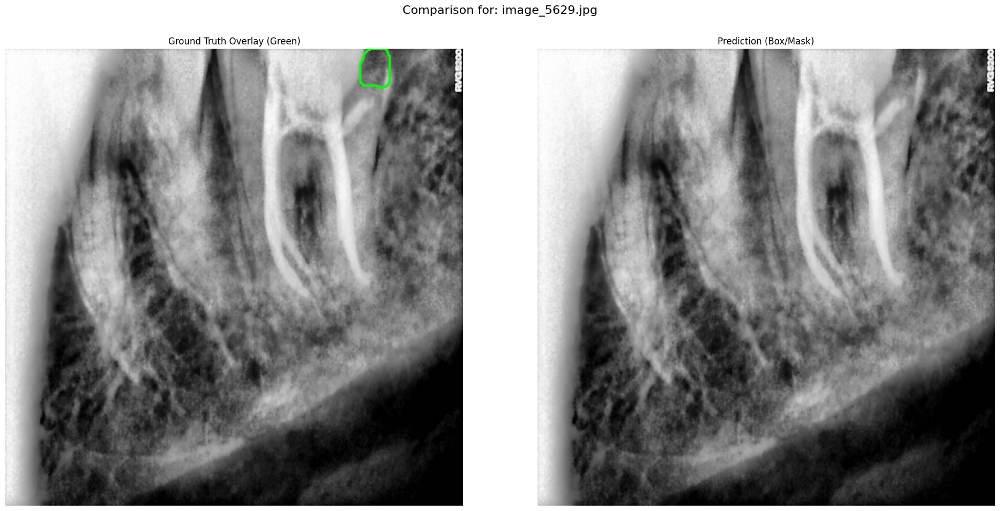


--- Comparison for image: image_5678.jpg ---


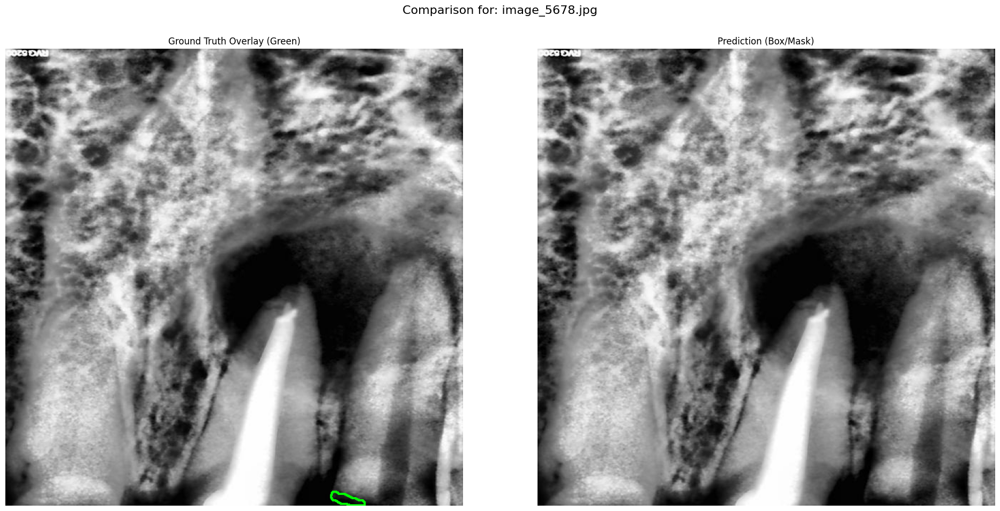


--- Comparison for image: image_5686.jpg ---


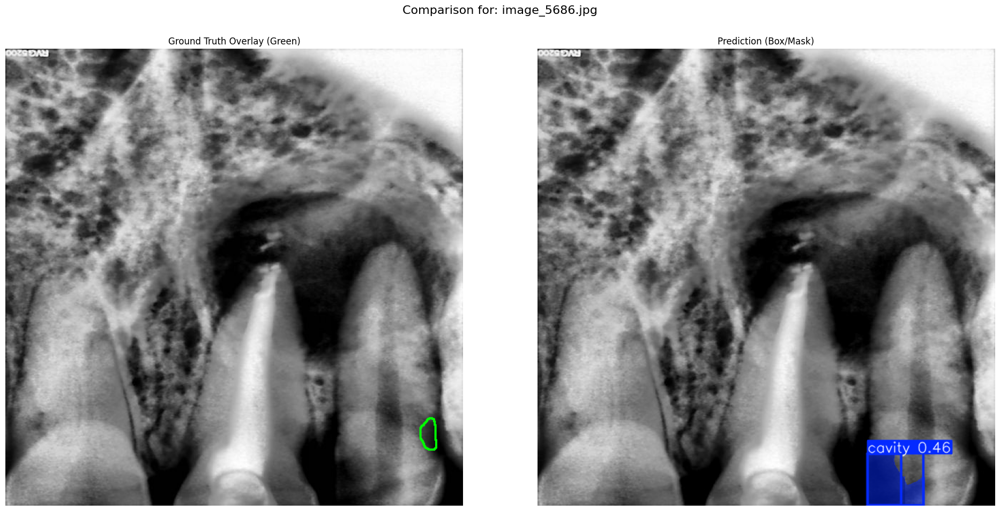


--- Comparison for image: image_5690.jpg ---


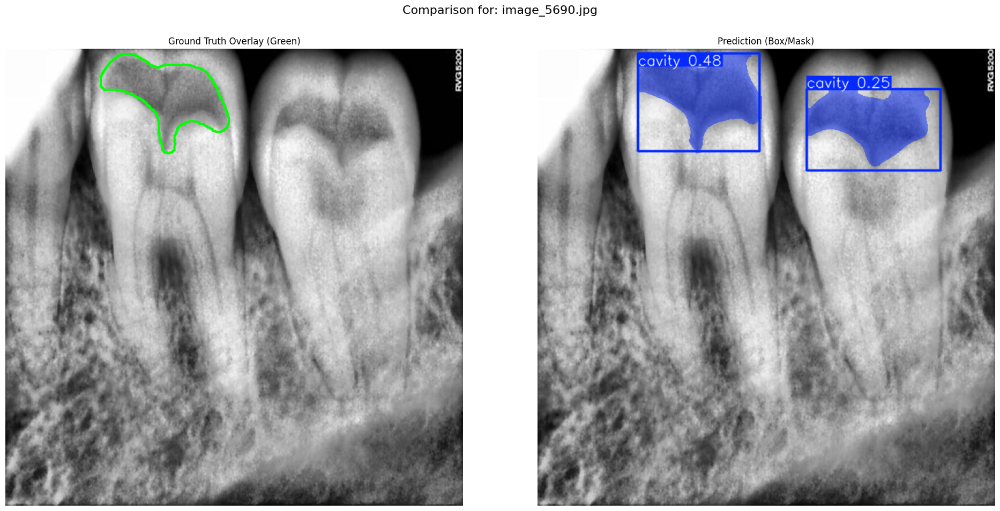


--- Comparison for image: image_5720.jpg ---


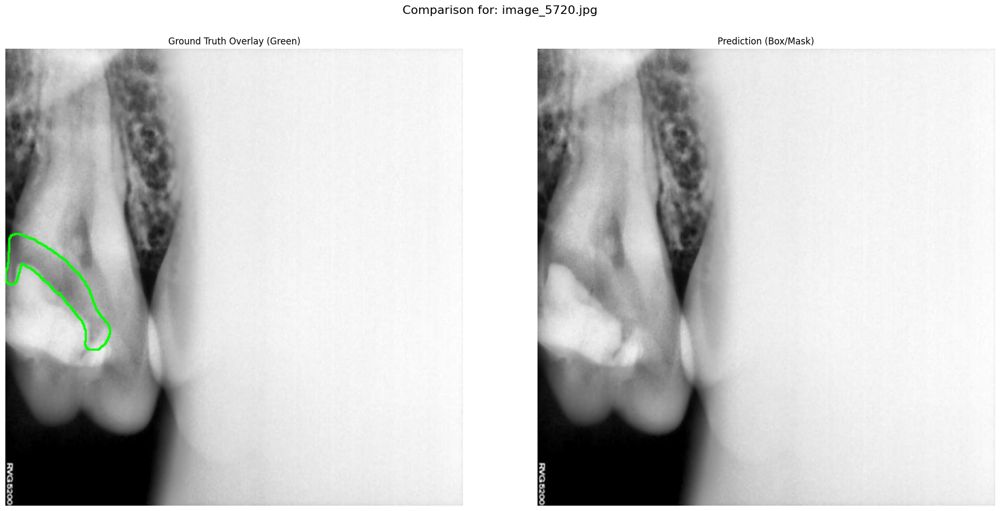


--- Comparison for image: image_5785.jpg ---


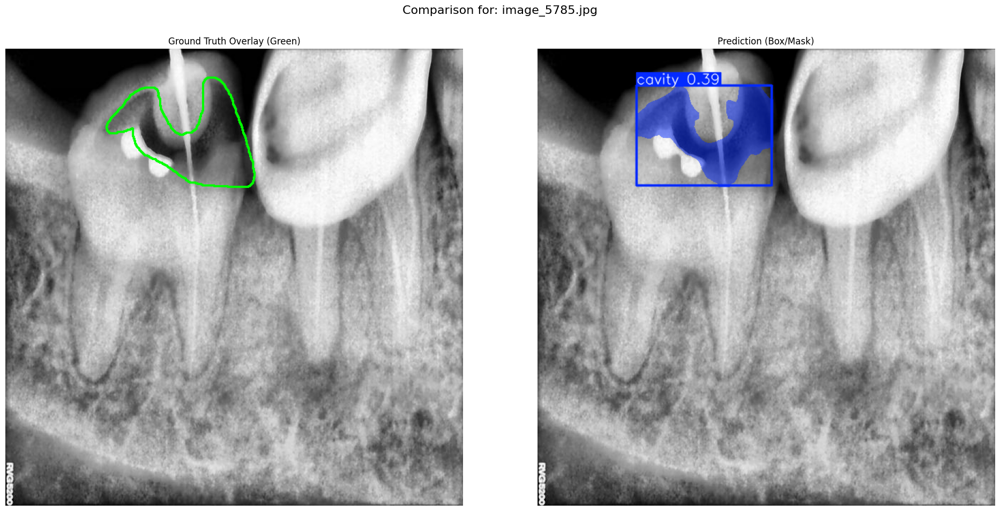


--- Comparison for image: image_5789.jpg ---


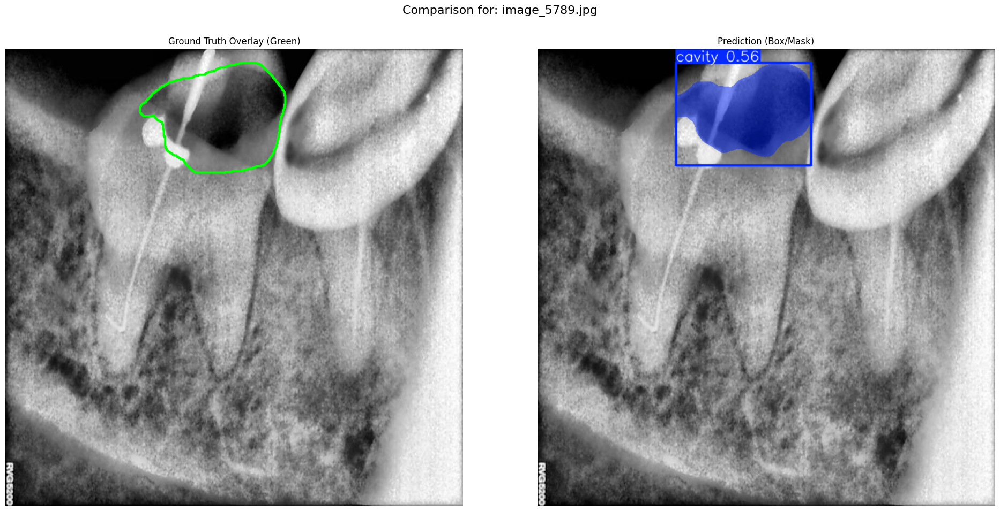


--- Comparison for image: image_5794.jpg ---


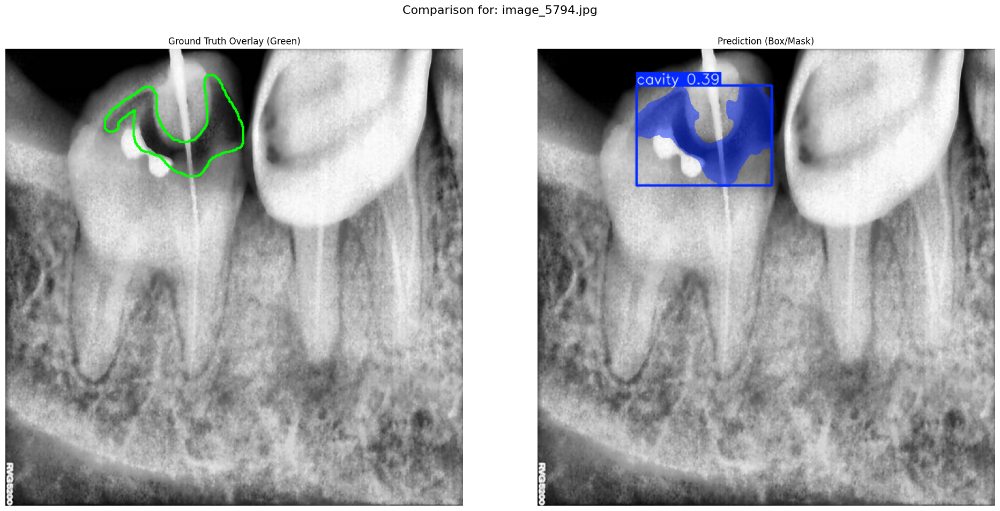


--- Comparison for image: image_5816.jpg ---


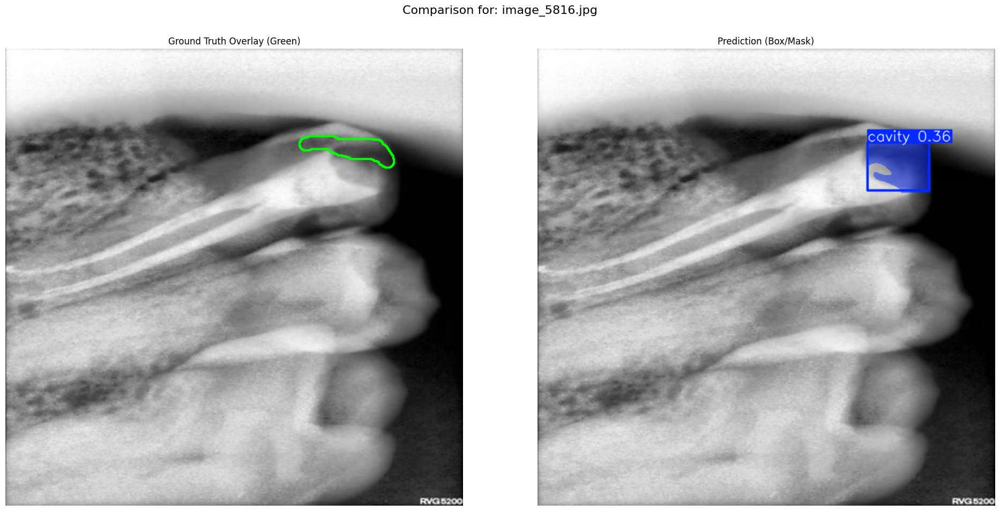


--- Comparison for image: image_5849.jpg ---


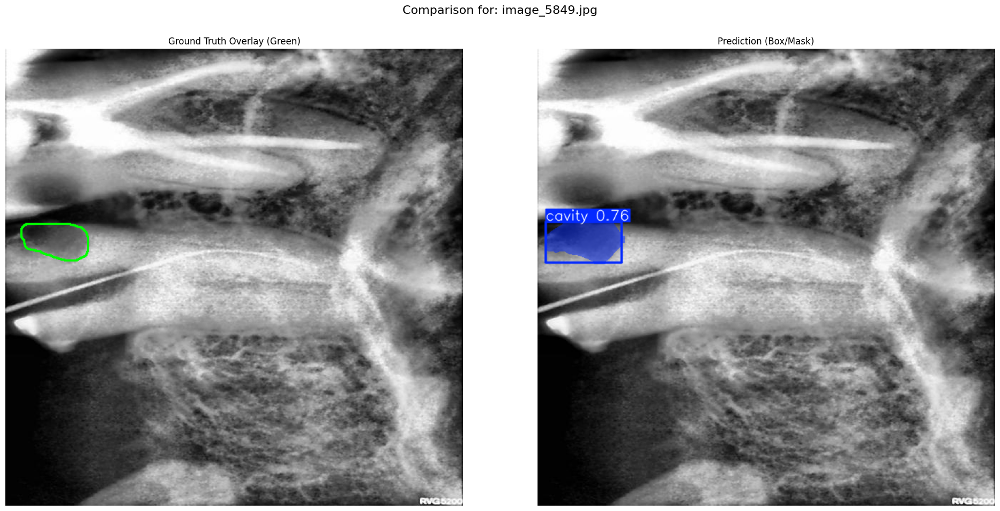


--- Comparison for image: image_5870.jpg ---


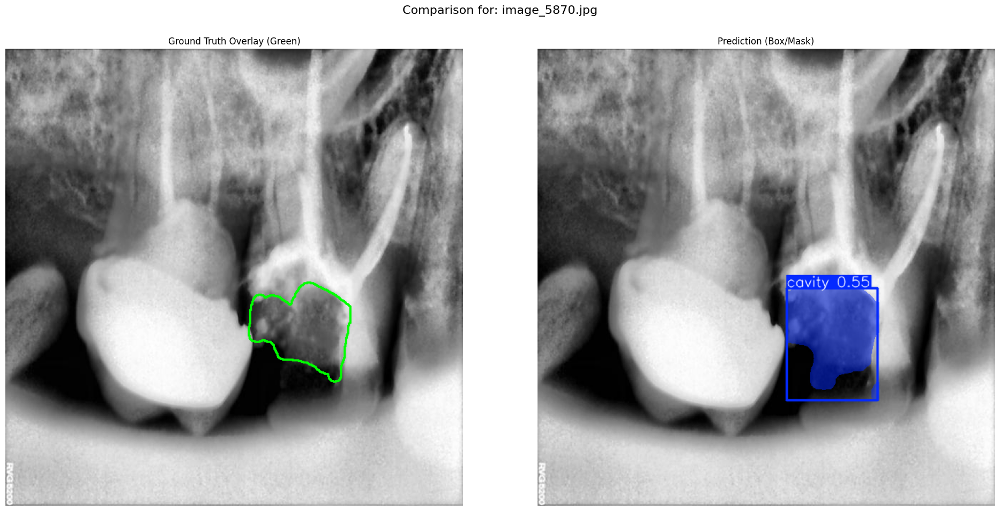


--- Comparison for image: image_5876.jpg ---


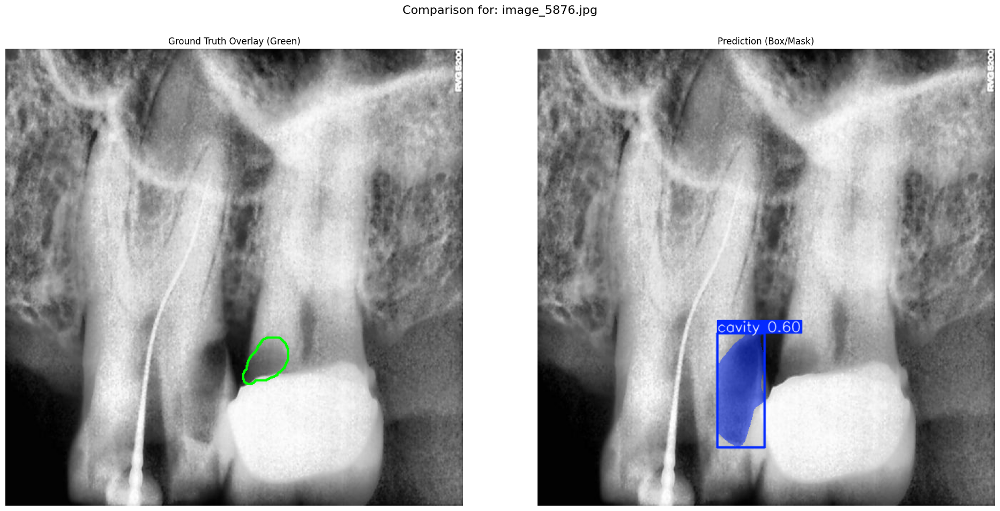


--- Comparison for image: image_5897.jpg ---


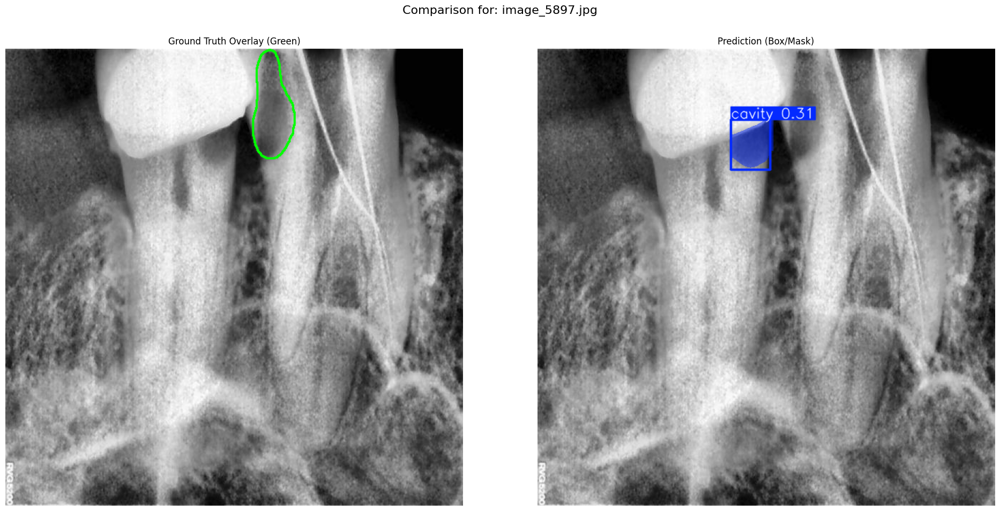


--- Comparison for image: image_5901.jpg ---


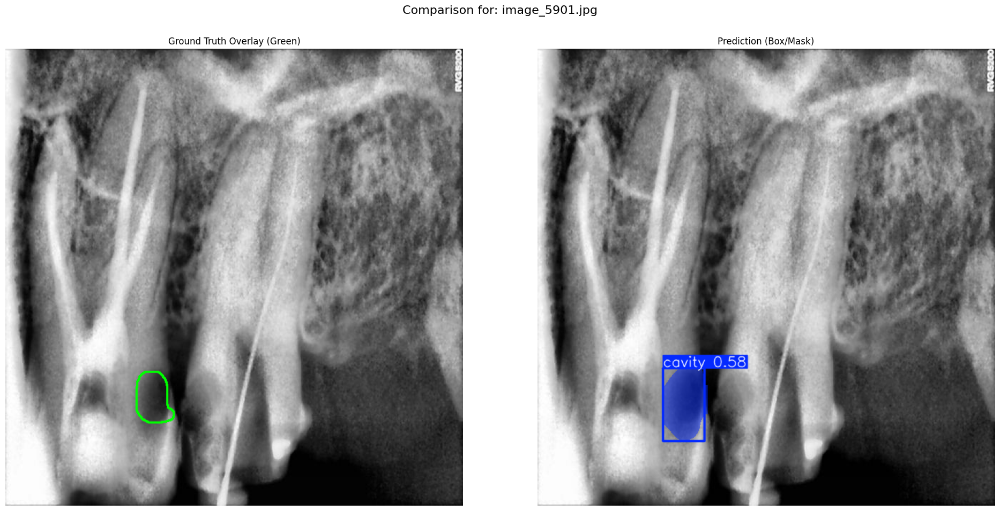

In [30]:
import matplotlib.pyplot as plt
import cv2
import os
import glob
import numpy as np
from tqdm.notebook import tqdm # Use notebook tqdm

variables_ok = True

# Proceed only if variables exist
if variables_ok:
    val_image_dir = os.path.join(output_dir, 'images/val') # Path where val images were copied by Cell 4

    print(f"Looking for validation images in: {val_image_dir}")
    if not os.path.isdir(val_image_dir):
         print(f"Error: Validation image directory does not exist: {val_image_dir}")
         variables_ok = False # Cannot proceed without images

if variables_ok:

    # These are the images copied to the val set by Cell 4
    sample_image_paths = sorted(glob.glob(os.path.join(val_image_dir, '*.jpg')))[:15] # Limit visualization

    if not sample_image_paths:
        print(f"Error: No validation images found in {val_image_dir}. Did Cell 4 run correctly?")
    else:
        print(f"\nRunning inference and visualizing {len(sample_image_paths)} sample validation images...")

        # --- Run prediction ---
        results_list = model(sample_image_paths, imgsz=train_imgsz, conf=0.25, verbose=False)
        print("Inference complete.")


        for i, results in enumerate(tqdm(results_list, desc="Visualizing Samples")):
            current_image_path = sample_image_paths[i] # Path to image in the 'val' directory
            base_filename = os.path.basename(current_image_path)
            name, _ = os.path.splitext(base_filename)

            gt_mask_path = os.path.join(mask_dir, f"{name}.png") # Use mask_dir variable

            print(f"\n--- Comparison for image: {base_filename} ---")

            original_img_bgr = cv2.imread(current_image_path)
            if original_img_bgr is None:
                print(f"  Warning: Could not load image {base_filename} from {val_image_dir}")
                continue
            original_img_rgb = cv2.cvtColor(original_img_bgr, cv2.COLOR_BGR2RGB)

            gt_visualization_rgb = original_img_rgb.copy() # Start with clean image
            if os.path.exists(gt_mask_path):
                gt_mask = cv2.imread(gt_mask_path, cv2.IMREAD_GRAYSCALE)
                if gt_mask is not None:
                    contours, _ = cv2.findContours(gt_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
                    cv2.drawContours(gt_visualization_rgb, contours, -1, (0, 255, 0), 2) # Green GT
                else:
                    print(f"  Warning: Could not read GT mask {os.path.basename(gt_mask_path)}")
            else:
                print(f"  Warning: GT mask path not found: {gt_mask_path}")

            pred_img_bgr = results.plot(conf=0.25)
            pred_img_rgb = cv2.cvtColor(pred_img_bgr, cv2.COLOR_BGR2RGB)

            fig, axes = plt.subplots(1, 2, figsize=(20, 10))
            axes[0].imshow(gt_visualization_rgb)
            axes[0].set_title(f'Ground Truth Overlay (Green)')
            axes[0].axis('off')

            axes[1].imshow(pred_img_rgb)
            axes[1].set_title(f'Prediction (Box/Mask)')
            axes[1].axis('off')

            plt.suptitle(f"Comparison for: {base_filename}", fontsize=16)
            plt.tight_layout(rect=[0, 0.03, 1, 0.95])
            plt.show()
else:
    print("\nSkipping visualization due to missing variables or directories.")